In [1]:
# run me once
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/simonpicard/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/simonpicard/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import ppscore as pps
import shap
import matplotlib.pyplot as plt

from os import path
from pandas_profiling import ProfileReport
from nltk import word_tokenize
from nltk.corpus import stopwords
from scipy.spatial import distance
from tqdm import tqdm
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFECV
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.ensemble import GradientBoostingRegressor

In [2]:
sns.set()
stop_words = stopwords.words('english')

# Config

In [3]:
# setting to config parameters

imdb_data_path = "./data/" #set to path to folder containing imdb data
rating_col = "weighted_average_vote"
title_id = "imdb_title_id"
name_id = "imdb_name_id"
rating_value = 7.5
target = "rating_{}".format(rating_value)
compute_desc_knn = False # set to True if you wish to recompute the description embedding KNN
compute_grid_search = False # set to True if you wish to recompute the model hyperparameter gridsearch
compute_rfe = False # set to true if you wish to recompute the recursive feature selection

# Data ingestion

In [4]:
movies = pd.read_csv(path.join(imdb_data_path, "IMDb movies.csv"))
names = pd.read_csv(path.join(imdb_data_path, "IMDb names.csv"))
ratings = pd.read_csv(path.join(imdb_data_path, "IMDb ratings.csv"))
title_principals = pd.read_csv(path.join(imdb_data_path, "IMDb title_principals.csv"))

Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.


In [5]:
# load the GloVe vectors in a dictionary:

embeddings_index = {}

if compute_desc_knn:
    f = open('./data/glove.840B.300d.txt', encoding="utf8")
    for line in tqdm(f):
        values = line.split()
        word = values[0]
        try:
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
        except ValueError:
            pass
    f.close()

    print('Found %s word vectors.' % len(embeddings_index))

# Data exploration

In [7]:
# using pandas profiling to explore the datasets

movies_profile = ProfileReport(movies)
movies_profile

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

features to explore:
* date_published to day count
* genre (one hot)
* duration (filter outlier)
* country (one hot)
* language (one hot)
* description (word to vec)
* budget (but to many missing)

In [8]:
names_profile = ProfileReport(names)
names_profile

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

features to explore:
* age
* is dead

In [9]:
ratings.head()

,imdb_title_id,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
0,tt0000574,6.1,537,6.3,6.0,54,17,55,121,122,...,6.0,19.0,6.6,14.0,6.3,64.0,6.0,89.0,6.2,309.0
1,tt0001892,5.9,171,6.1,6.0,5,6,17,41,52,...,5.8,4.0,6.5,8.0,5.9,29.0,6.2,27.0,6.0,114.0
2,tt0002101,5.2,420,5.2,5.0,12,8,16,60,89,...,5.5,14.0,6.2,20.0,4.9,57.0,5.5,197.0,4.7,103.0
3,tt0002130,7.0,2019,6.9,7.0,194,208,386,571,308,...,7.3,74.0,7.4,75.0,7.0,126.0,7.1,452.0,7.0,1076.0
4,tt0002199,5.7,438,5.8,6.0,28,15,42,75,114,...,4.8,10.0,6.5,15.0,5.7,56.0,5.9,161.0,5.7,164.0


target is weighted_average_vote or mean_vote

In [11]:
title_principals.head()

,imdb_title_id,ordering,imdb_name_id,category,job,characters
0,tt0000009,1,nm0063086,actress,NaN,"[""Miss Geraldine Holbrook (Miss Jerry)""]"
1,tt0000009,2,nm0183823,actor,NaN,"[""Mr. Hamilton""]"
2,tt0000009,3,nm1309758,actor,NaN,"[""Chauncey Depew - the Director of the New Yor..."
3,tt0000009,4,nm0085156,director,NaN,NaN
4,tt0000574,1,nm0846887,actress,NaN,"[""Kate Kelly""]"


In [12]:
title_principals["category"].value_counts()

actor                  222337
actress                133414
writer                 122793
producer               101092
director                88968
composer                66861
cinematographer         55423
editor                  33780
production_designer      9485
self                      909
archive_footage           444
archive_sound               7
Name: category, dtype: int64

In [12]:
title_principals["job"].value_counts()

producer                   44262
screenplay                 11084
written by                  4727
director of photography     4720
story                       4358
                           ...  
play 'Ruz-Bárcenas'            1
novel: "Lacrime impure"        1
novel "Krishnopokkho "         1
idea by                        1
screenplay advice              1
Name: job, Length: 4549, dtype: int64

allows to link movies to names
feature to explore:
* number of movie with rating above > 7.5 for each category

# Data formatting

In [6]:
# setting the id to the datasets

movies = movies.set_index(title_id)
ratings = ratings.set_index(title_id)

# Feature engineering

## Target computation

In [7]:
ratings[target] = ratings[rating_col] > rating_value
ratings[target] = ratings[target].astype(int)

## Historical ratings for film crew

In [8]:
# add movie rating and date pulbished to title_principals
rating_history = title_principals.merge(ratings[[target]], left_on=title_id, right_index=True, how="left")
rating_history = rating_history.merge(movies[["date_published"]], left_on=title_id, right_index=True, how="left")

rating_history_columns = [title_id, name_id, "category", target, "date_published"]
rating_history_select = rating_history[rating_history_columns]
rating_history_select.head()

,imdb_title_id,imdb_name_id,category,rating_7.5,date_published
0,tt0000009,nm0063086,actress,0.0,1894-10-09
1,tt0000009,nm0183823,actor,0.0,1894-10-09
2,tt0000009,nm1309758,actor,0.0,1894-10-09
3,tt0000009,nm0085156,director,0.0,1894-10-09
4,tt0000574,nm0846887,actress,0.0,1906-12-26


In [9]:
# join rating_history on itself to know on which other movies the movie crew worked
rating_history_join = rating_history_select.merge(rating_history_select, on=name_id, suffixes = ("", "_history"), how="left")

# keep only movies older than the current movie
rating_history_filter = rating_history_join["date_published"] > rating_history_join["date_published_history"]
rating_history_filtered = rating_history_join.loc[rating_history_filter]

# get the number of older movies for which the film crew worked, and the number of those above the rating target
rating_history_agg = rating_history_filtered.groupby([title_id, "category"])["{}_history".format(target)].agg(["count", "sum"])
# compute the ratio of movies reaching the rating target
rating_history_agg['ratio'] = rating_history_agg['sum']/rating_history_agg['count']

# rename the columns
rating_history_agg = rating_history_agg.unstack(-1)
rating_history_agg.columns = ["target_history_{}_{}".format(x[0], x[1]) for x in rating_history_agg.columns]

# fill missing values
rating_history_agg = rating_history_agg.fillna(0)
# the count is actually 0, the ratio is undefined but the model will be able to pick it using the count

rating_history_agg.head()

,target_history_count_actor,target_history_count_actress,target_history_count_archive_footage,target_history_count_archive_sound,target_history_count_cinematographer,target_history_count_composer,target_history_count_director,target_history_count_editor,target_history_count_producer,target_history_count_production_designer,...,target_history_ratio_archive_footage,target_history_ratio_archive_sound,target_history_ratio_cinematographer,target_history_ratio_composer,target_history_ratio_director,target_history_ratio_editor,target_history_ratio_producer,target_history_ratio_production_designer,target_history_ratio_self,target_history_ratio_writer
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0002423,6.0,2.0,0.0,0.0,2.0,0.0,6.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0003037,3.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0003102,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0003165,6.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0003167,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Movies

In [10]:
# get the number of days since the movie was released
movies["date_published"] = pd.to_datetime(movies["date_published"], errors="coerce")
movies["age"] = movies["date_published"] - movies["date_published"].min()
movies["age"] = movies["age"].dt.days

In [11]:
# get one hot encoded values for film genre, language and country
movies_genre = movies['genre'].str.replace(" ", "").str.get_dummies(sep=",")
movies_country = movies['country'].str.replace(" ", "").str.get_dummies(sep=",")
movies_language = movies['language'].str.replace(" ", "").str.get_dummies(sep=",")

In [12]:
# this function creates a normalized vector for the whole sentence
def sent2vec(s):
    words = str(s).lower()#.decode('utf-8')
    words = word_tokenize(words)
    words = [w for w in words if not w in stop_words]
    words = [w for w in words if w.isalpha()]
    M = []
    for w in words:
        try:
            M.append(embeddings_index[w])
        except:
            continue
    M = np.array(M)
    v = M.sum(axis=0)
    if type(v) != np.ndarray:
        return np.zeros(300)
    return v / np.sqrt((v ** 2).sum())

if compute_desc_knn:

    # get word embeddings for movie description
    movies_desc_emb = movies["description"].apply(sent2vec)
    movies_desc_emb = pd.DataFrame(movies_desc_emb.tolist(), index=movies_desc_emb.index)

    # join movie date and rating
    movies_desc_emb["date_published"] = movies["date_published"]
    movies_desc_emb[rating_col] = ratings[rating_col]

In [13]:
# this function computes the mean rating of the n closest older movies based on the description embeddings
def get_mean_filtered_knn(current_movies_description_emb, all_movies_description_emb, n_neighbours = 30, n_dim_embeddings = 300):
    
    scope = all_movies_description_emb["date_published"] < current_movies_description_emb["date_published"]
    older_movies_description_emb = all_movies_description_emb.loc[scope]
    
    if older_movies_description_emb.shape[0] < n_neighbours:
        return np.nan
    
    emb_columns = range(n_dim_embeddings)
    
    # computing the euclidean distance between the embeddings of the current movie and all older movies
    res = distance.cdist(current_movies_description_emb[emb_columns].values.reshape(1, -1), older_movies_description_emb[emb_columns])[0]
    
    # selection the n closest neighbours
    neighbours_id = np.argsort(res)[:n_neighbours]
    
    # getting the mean rating the ne clossest nieghbours
    return older_movies_description_emb.iloc[neighbours_id][rating_col].mean()

if compute_desc_knn:

    desc_emb_knn30_mean = movies_desc_emb.apply(lambda row: get_mean_filtered_knn(row, movies_desc_emb), axis=1)

    # saving the result as pickle file because it is a heavy computation
    desc_emb_knn30_mean.to_pickle("desc_emb_knn30_mean.pkl")

In [14]:
if not compute_desc_knn:
    # load the pre computed data
    desc_emb_knn30_mean = pd.read_pickle("./desc_emb_knn30_mean.pkl")

# Data join

In [15]:
# from movies
movies_columns = ["duration", "age"]
feature_table = movies.loc[:, movies_columns]

In [16]:
# from ratings
feature_table.loc[:, target] = ratings[target]

In [17]:
# fromm the embeddings knn 
feature_table.loc[:, "desc_knn_mean_rating"] = desc_emb_knn30_mean

In [18]:
# join all one encoded columns which represents at least  1% of the movies

one_hot_encoded_dfs = [movies_genre, movies_country, movies_language]

for one_hot_encoded_df in one_hot_encoded_dfs:
    columns_to_join = one_hot_encoded_df.sum()
    columns_to_join = columns_to_join.loc[columns_to_join>=movies.shape[0]/100].index
    feature_table = feature_table.join(one_hot_encoded_df[columns_to_join])

In [19]:
# join the historical rating of film crew, for the categories which are available for at least 1% of the movies

categories_in_scope = title_principals["category"].value_counts()
categories_in_scope = categories_in_scope.loc[categories_in_scope>=movies.shape[0]/100].index
rating_history_columns = ["target_history_count_{}".format(x) for x in categories_in_scope]
rating_history_columns += ["target_history_ratio_{}".format(x) for x in categories_in_scope]
feature_table = feature_table.join(rating_history_agg[rating_history_columns])

In [20]:
# get the list of features name
features = [x for x in feature_table.columns if x!=target]

# Filtering

In [21]:
na_values = feature_table.isna().sum()
na_values.loc[na_values>0].sort_values(ascending = False)

target_history_ratio_self                   2615
target_history_ratio_production_designer    2615
target_history_count_actor                  2615
target_history_count_actress                2615
target_history_count_writer                 2615
target_history_count_producer               2615
target_history_count_director               2615
target_history_count_composer               2615
target_history_count_cinematographer        2615
target_history_count_editor                 2615
target_history_count_production_designer    2615
target_history_count_self                   2615
target_history_ratio_actor                  2615
target_history_ratio_actress                2615
target_history_ratio_writer                 2615
target_history_ratio_producer               2615
target_history_ratio_director               2615
target_history_ratio_composer               2615
target_history_ratio_cinematographer        2615
target_history_ratio_editor                 2615
desc_knn_mean_rating

historical rating features are not available for half of the movies
it is due to missing records in the title_principals dataset
the assumption here is that the data is avaialble but not updated yet, therefore I chose to keep the features and drop the missings, assuming the mssing title_principals data will become available

In [22]:
feature_table = feature_table.dropna()

# Train validation split

In [23]:
X = feature_table[features]
y = feature_table[target]

In [24]:
# selecting 10% of the data as validation set

X_train_test, X_val, y_train_test, y_val = train_test_split(X, y, test_size=0.1, random_state=0)

# Resampling

<AxesSubplot:>

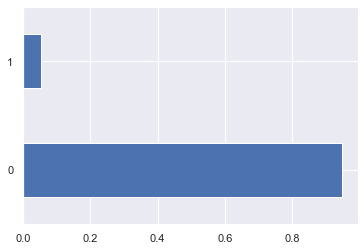

In [25]:
value_counts = y_train_test.value_counts()
(value_counts/value_counts.sum()).plot(kind="barh")

as the dataset is imbalanced, we will resample it using a random over sample to 1:10

In [26]:
ros = RandomOverSampler(random_state=0, sampling_strategy=0.1)

# Modeling

In [27]:
# using GradientBoostingRegressor for the classification as it performs well for tabular data
clf = GradientBoostingRegressor()

# Pipeline

In [28]:
# building a pipeline including the over sampler and the classifier
boost_model = Pipeline([
        ('upsampling', ros),
        ('clf', clf)
    ])

# Feature selection

In [29]:
# getting ppscore for our features

# resampling the data to 1:1 to get scores representing correct prediction of the two classes as ppscore uses decision trees
ros_ppscore = RandomOverSampler(random_state=0, sampling_strategy=1)
X_ppscore, y_ppscore = ros_ppscore.fit_resample(X_train_test, y_train_test)

X_y_ppscore = X_ppscore.join(y_ppscore.astype(str))

predictors_df = pps.predictors(X_y_ppscore, y=target, sample = None)
predictors_df.head()

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,age,rating_7.5,0.667114,classification,True,weighted F1,0.50184,0.834170,DecisionTreeClassifier()
1,duration,rating_7.5,0.359125,classification,True,weighted F1,0.50184,0.680742,DecisionTreeClassifier()
2,target_history_ratio_actor,rating_7.5,0.342537,classification,True,weighted F1,0.50184,0.672478,DecisionTreeClassifier()
3,target_history_ratio_director,rating_7.5,0.314862,classification,True,weighted F1,0.50184,0.658692,DecisionTreeClassifier()
4,desc_knn_mean_rating,rating_7.5,0.238645,classification,True,weighted F1,0.50184,0.620724,DecisionTreeClassifier()


In [30]:
# getting the number of features bringing predictive power according to pps
n_feature_max = (predictors_df["ppscore"]>0).sum()

In [32]:
n_feature_max

21

In [31]:
# using recursive feature ranking to select which feature to keep in the model

# creating a function to get the feature importance from the model in the pipeline
get_feature_importance = lambda pipe: np.array(list(pipe['clf'].feature_importances_))


# using average precision, or area under the precision curve, as scoring because it is based on the decision function and therefore allows to choose the prediction threshold based on the use case
selector = RFECV(boost_model, step=1, cv=5, verbose=10, scoring='average_precision', n_jobs=5, importance_getter=get_feature_importance)

if compute_rfe:
    selector = selector.fit(X_train_test[predictors_df["x"].iloc[:n_feature_max]], y_train_test)

    pd.Series(selector.grid_scores_.mean(axis=1), index=range(1, n_feature_max+1)).plot(kind="barh")

    # selection the feature based on the recursive selection search
    feature_list = predictors_df["x"].iloc[:n_feature_max].loc[selector.support_]
    
else:
    feature_list = ['age',
     'duration',
     'target_history_ratio_actor',
     'target_history_ratio_director',
     'desc_knn_mean_rating',
     'Drama',
     'English',
     'target_history_ratio_composer',
     'target_history_ratio_writer',
     'target_history_count_producer',
     'target_history_ratio_actress',
     'target_history_count_director',
     'target_history_ratio_cinematographer',
     'target_history_count_actress',
     'target_history_count_actor',
     'India',
     'target_history_count_writer',
     'target_history_ratio_producer',
     'target_history_count_cinematographer']

Fitting estimator with 21 features.
Fitting estimator with 20 features.


X does not have valid feature names, but RFECV was fitted with feature names
The `grid_scores_` attribute is deprecated in version 1.0 in favor of `cv_results_` and will be removed in version 1.2.


ValueError: Length of passed values is 21, index implies 20.

# Model tuning

In [45]:
# tune regressor parameters using a grid search

parameters = {
    #'clf__objective':['binary:logistic'],
    'clf__learning_rate': [0.1, 0.05], #explore multi feature pattern
    'clf__max_depth': [2, 3, 5, 7, 9], #explore multi feature pattern
    #'clf__gamma': [0, 0.5, 1, 1.5, 2, 5], #avoid overfit
    #'clf__min_child_weight': [1, 5, 10], #avoid overfit
    #'clf__silent': [0],
    'clf__subsample': [0.6, 0.8, 1.0], #avoid overfit
    #'clf__colsample_bytree': [0.6, 0.8, 1.0], #avoid overfit
    'clf__n_estimators': [1000], #high number of tree but with an early stopping of 50
    'clf__random_state': [2021],
    'clf__n_iter_no_change': [50],
    'clf__tol':[0.01],
}

# using the validation set to evaluate the model for early stopping
fit_params={
    # "clf__early_stopping_rounds":50, 
    # "clf__eval_metric" : "aucpr", 
    # "clf__eval_set" : [[X_val[feature_list], y_val]],
    # "clf__verbose" : False
   }


clf_gs = GridSearchCV(boost_model, parameters, 
                      n_jobs=4,
                   cv=5, 
                   scoring='average_precision',
                   verbose=10, refit=True)

if compute_grid_search:

    clf_gs.fit(X_train_test[feature_list], y_train_test, **fit_params)

    print(clf_gs.cv_results_["mean_test_score"].max())
    regr_params = clf_gs.best_params_
    
else:
    regr_params = {
        'clf__learning_rate': 0.1,
        'clf__max_depth': 5,
        'clf__n_estimators': 1000,
        'clf__n_iter_no_change': 50,
        'clf__random_state': 2021,
        'clf__subsample': 0.6,
        'clf__tol': 0.01
    }

Fitting 5 folds for each of 30 candidates, totalling 150 fits


X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names


0.3034397311643866


# Model evaluation

In [50]:
# testing on the validation dataset

boost_model.set_params(**regr_params)

boost_model.fit(X_train_test[feature_list], y_train_test, **fit_params)

y_score = boost_model.predict(X_val[feature_list])

print(average_precision_score(y_val, y_score))


X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names


0.2670578169924793


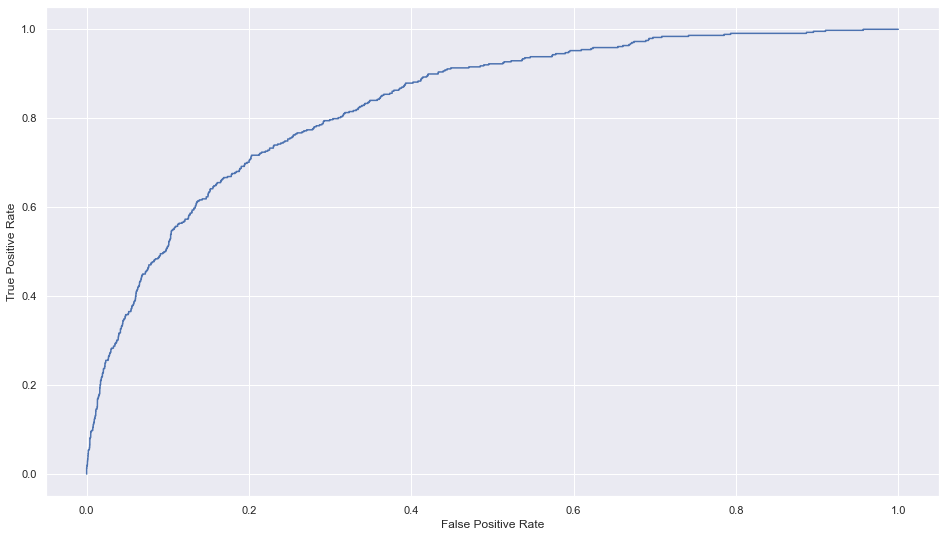

In [53]:
#plotting the ROC curve

f, ax = plt.subplots(figsize = (16,9))

fpr, tpr, _ = roc_curve(y_val, y_score)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(ax=ax)

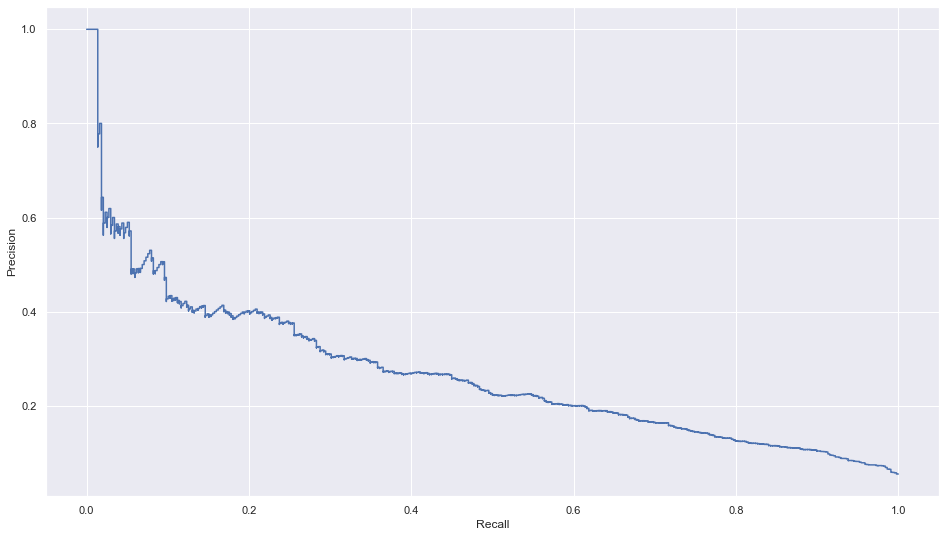

In [55]:
#plotting the PR curve

f, ax = plt.subplots(figsize = (16,9))

prec, recall, _ = precision_recall_curve(y_val, y_score)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(ax=ax)

# Model insights

<AxesSubplot:ylabel='x'>

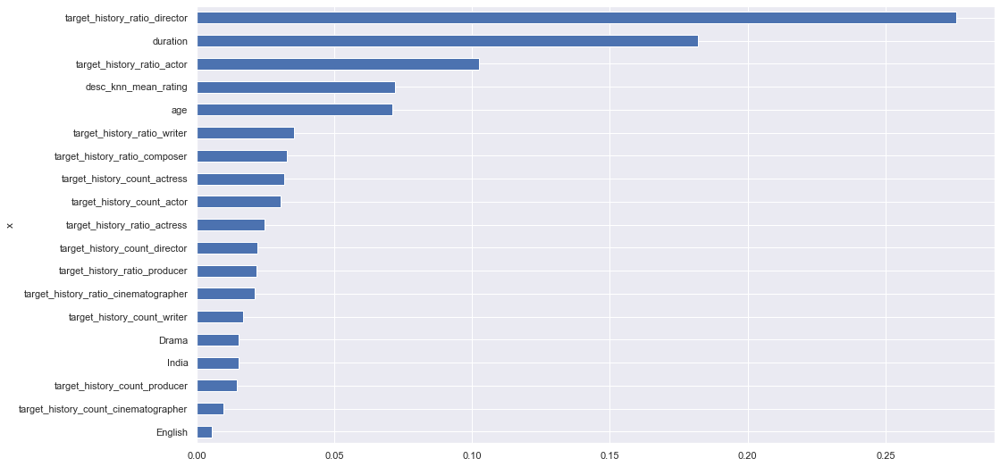

In [59]:
# getting feature importance based on split gain

f, ax = plt.subplots(figsize = (16,9))

pd.Series(boost_model['clf'].feature_importances_, index=feature_list).sort_values().plot(kind="barh", ax=ax)

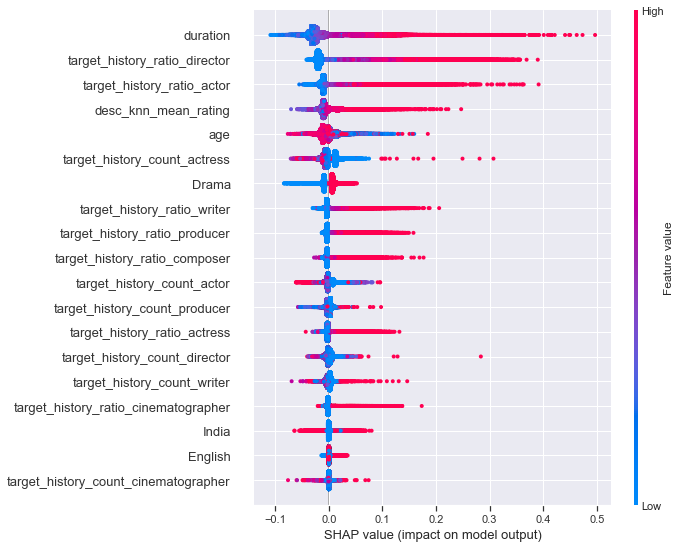

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


<Figure size 1152x648 with 0 Axes>

In [60]:
# getting feature importance using shapley value

# load JS visualization code to notebook
shap.initjs()

explainer = shap.TreeExplainer(boost_model["clf"])
shap_values = explainer.shap_values(X_train_test[feature_list])

shap.summary_plot(shap_values, X_train_test[feature_list])

f = plt.gcf()
f.set_size_inches(16, 9)
f.show()

In [61]:
feature_importance_order = np.array(feature_list)[np.argsort(np.abs(shap_values).mean(0))][::-1].tolist()

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


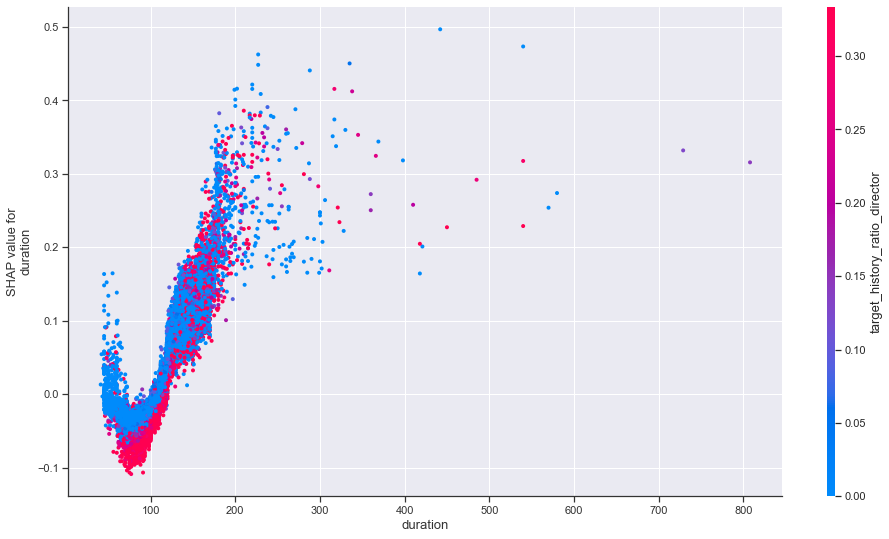

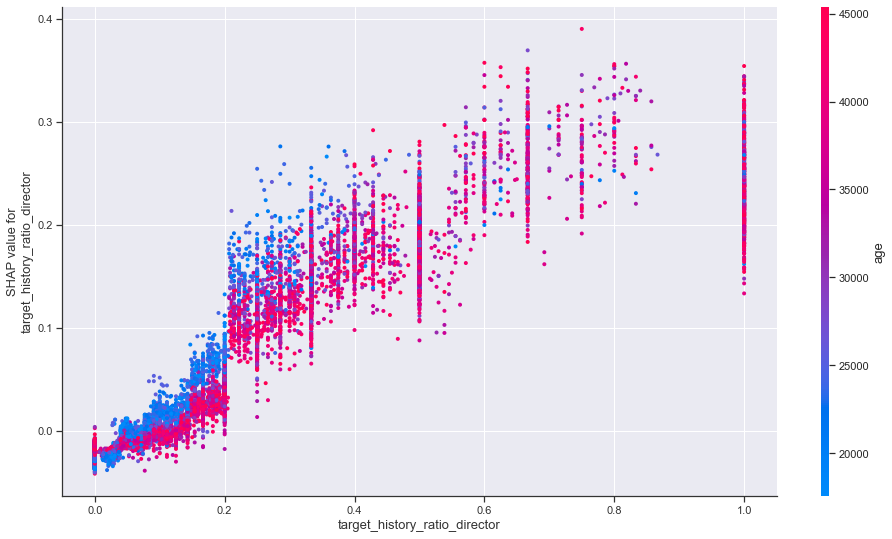

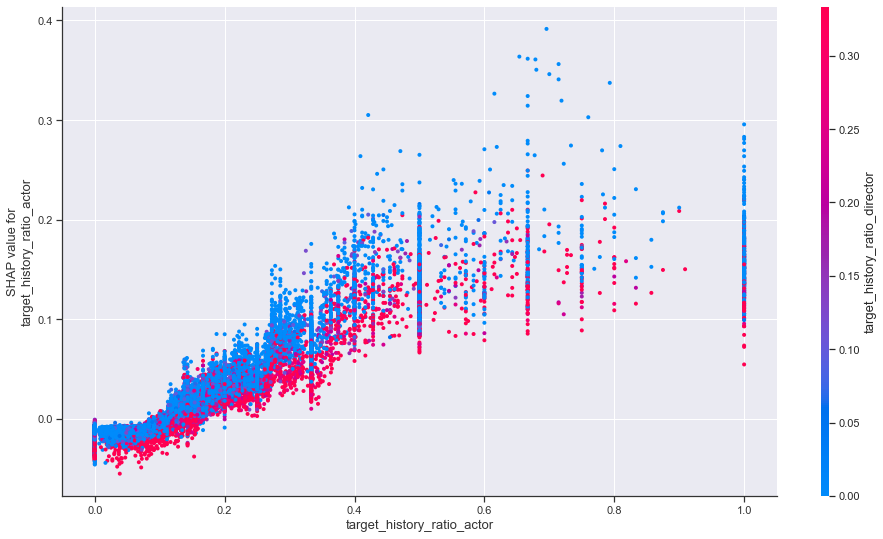

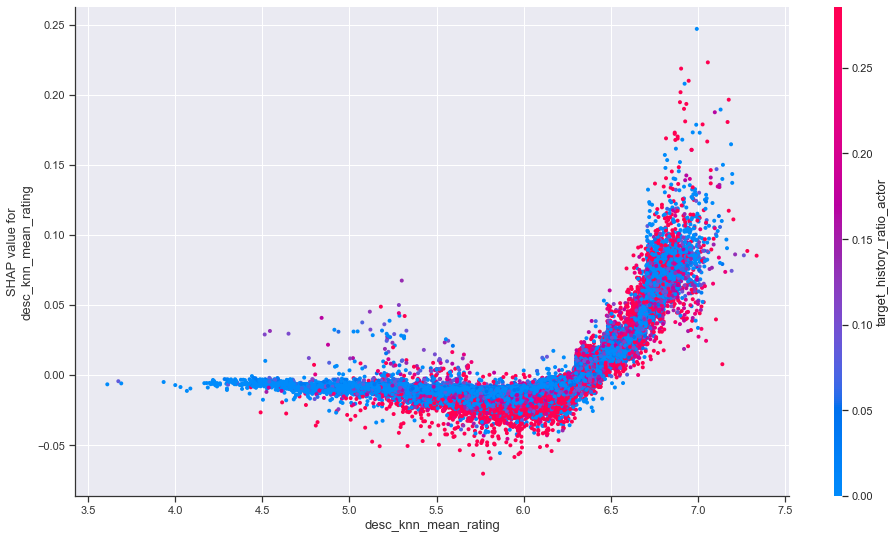

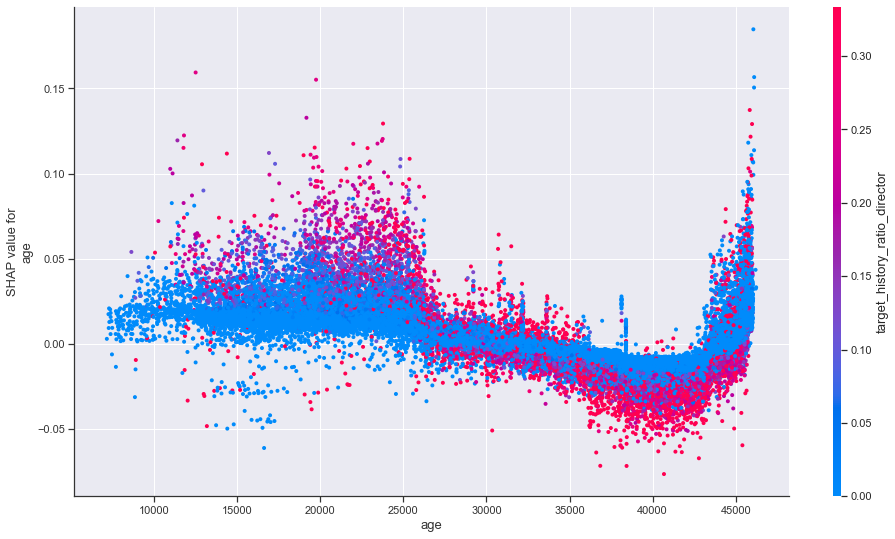

...

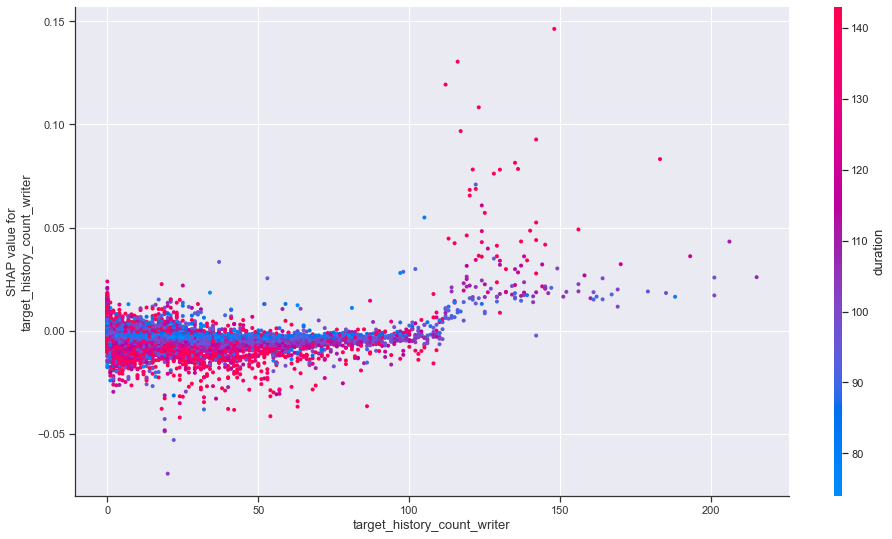

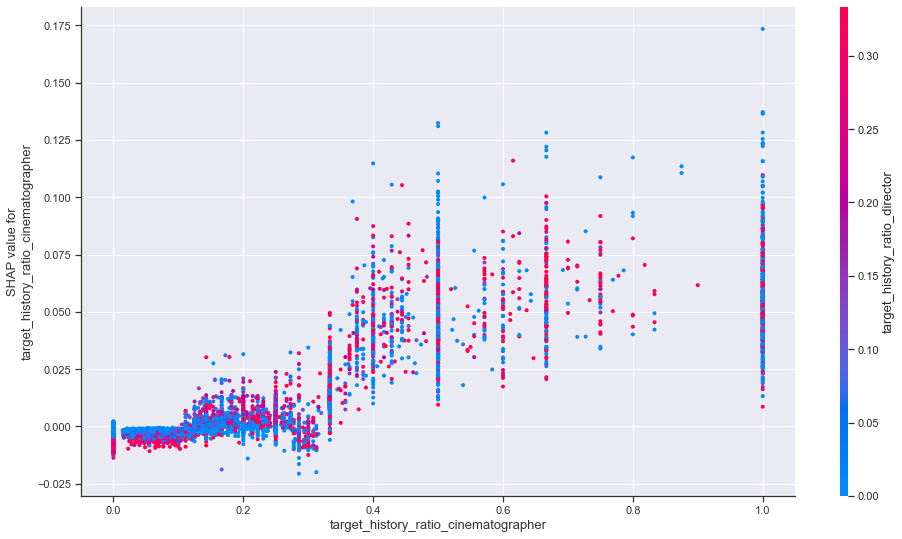

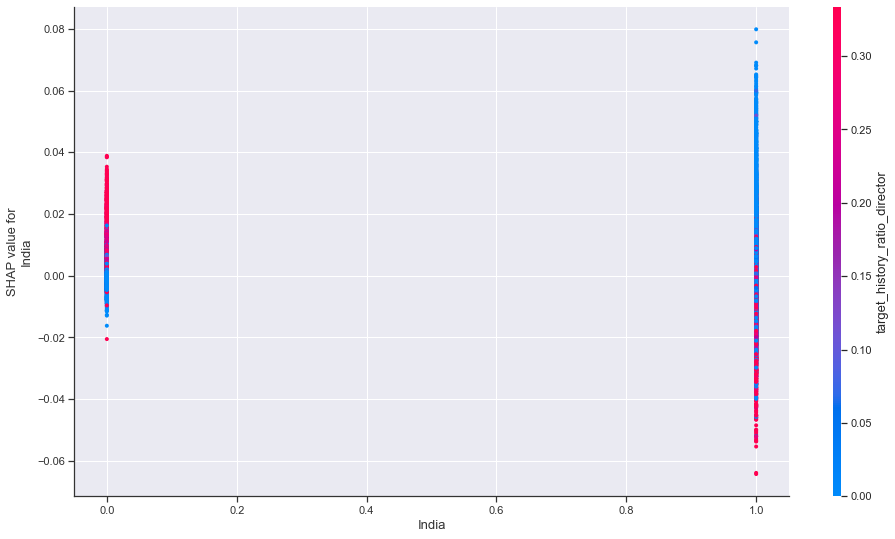

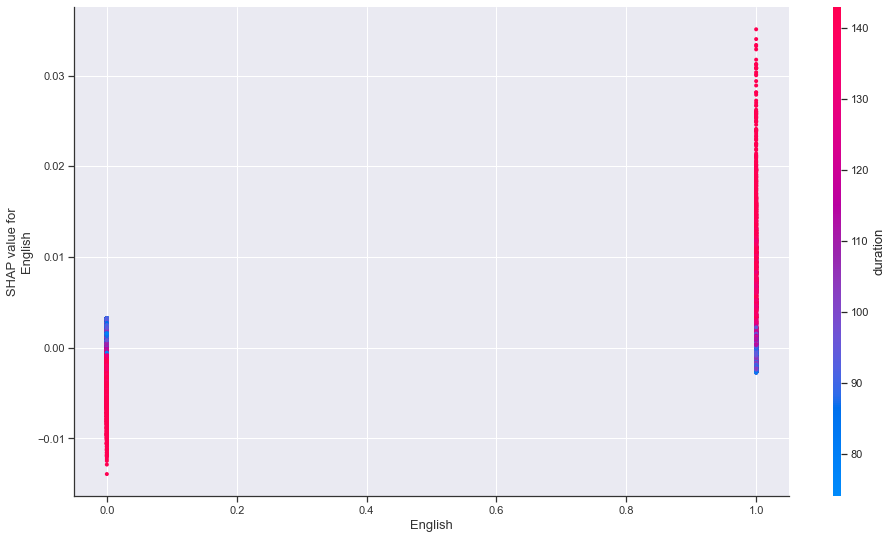

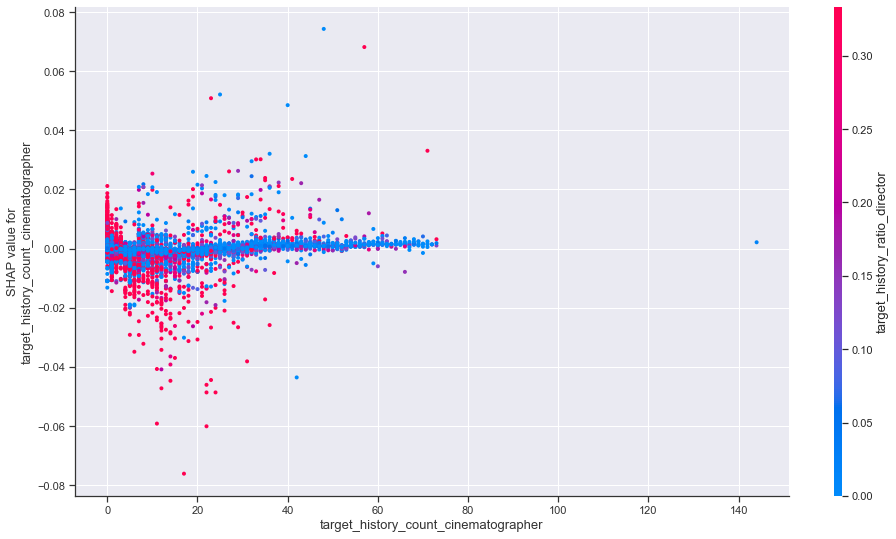

In [62]:
# get the impact on the prediction for each feature

for feature in feature_importance_order:
    shap.dependence_plot(feature, shap_values, X_train_test[feature_list], show=False)
    f = plt.gcf()
    f.set_size_inches(16, 9)
    f.show()

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


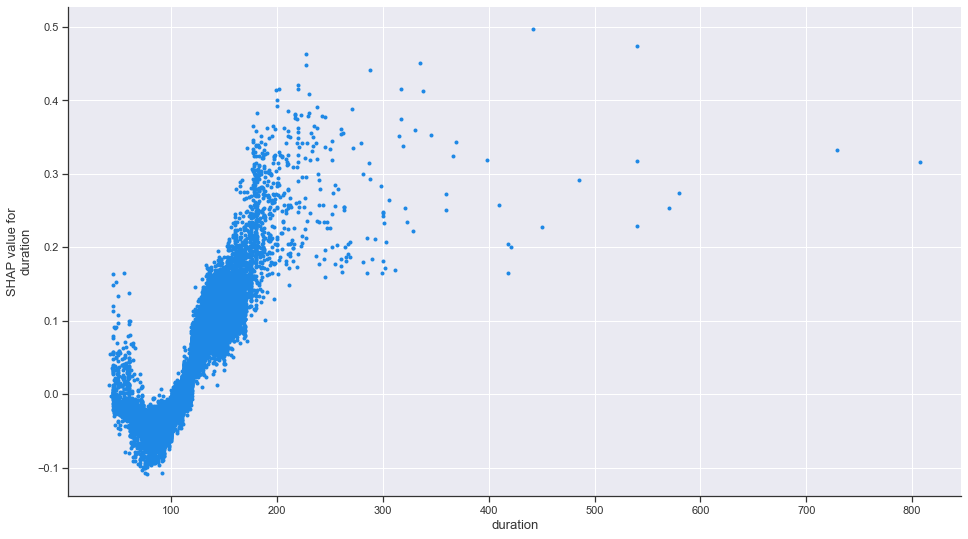

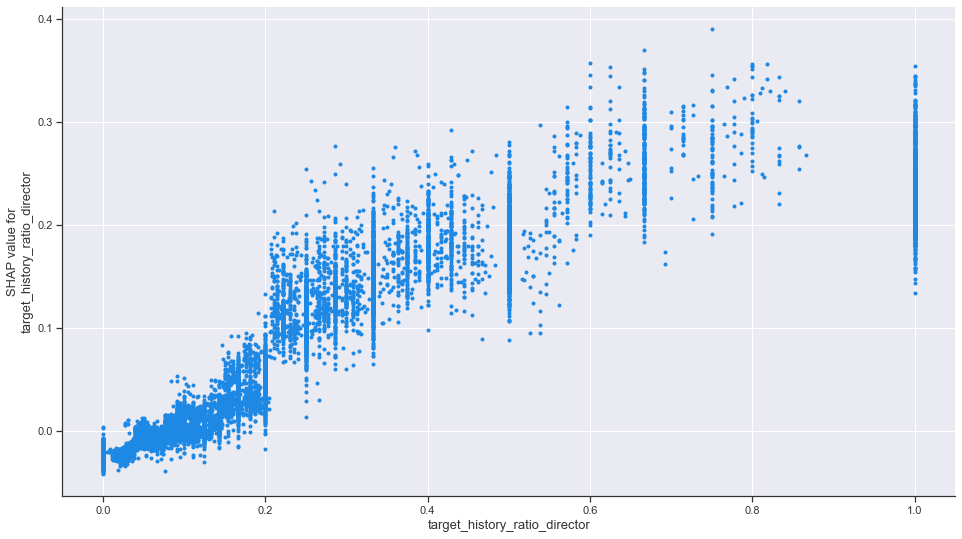

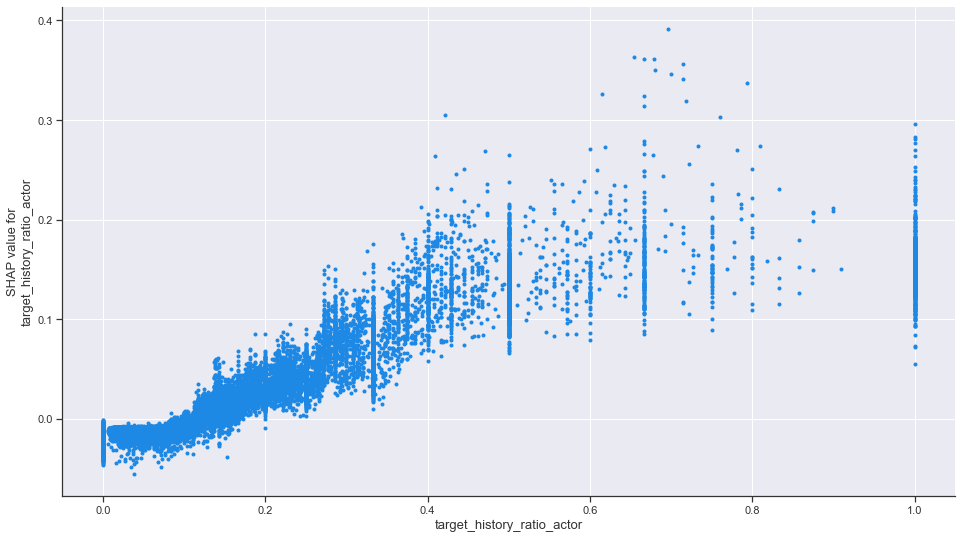

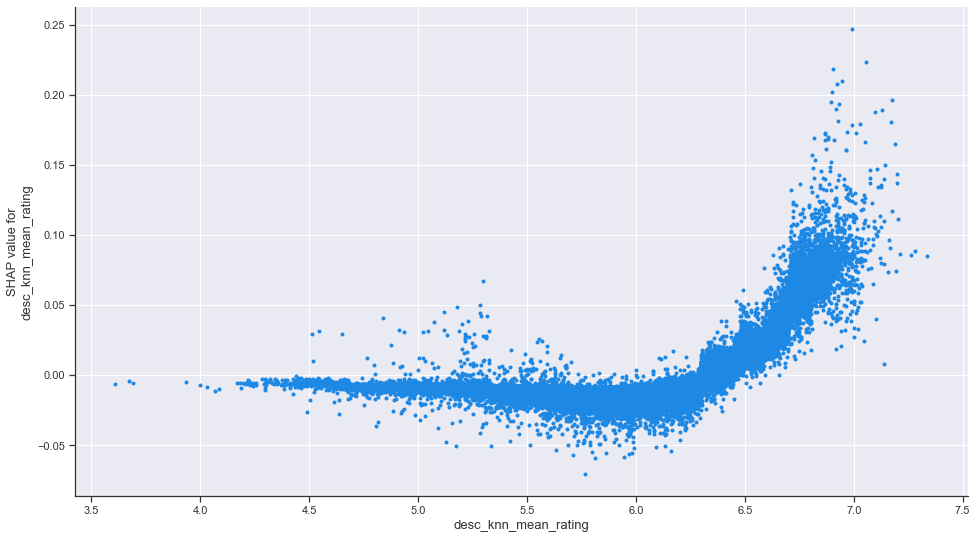

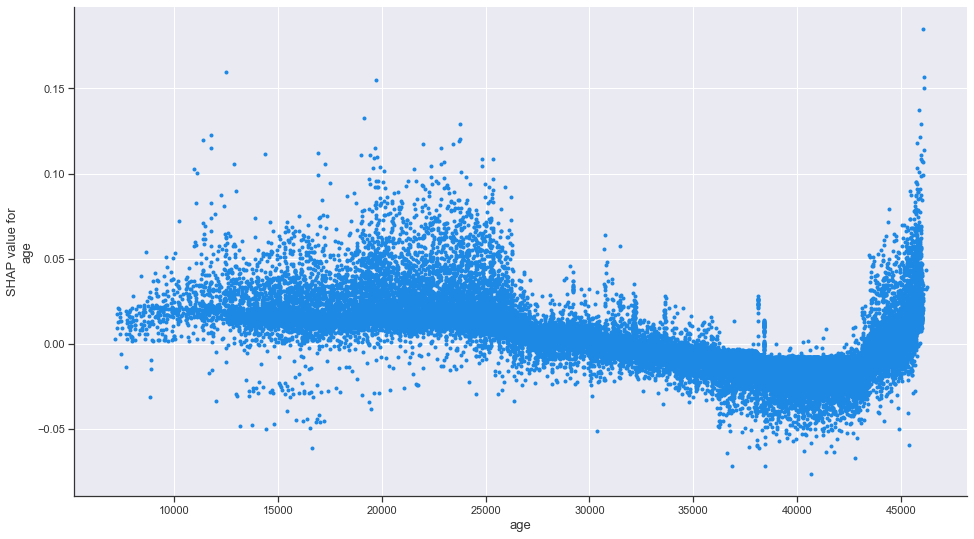

...

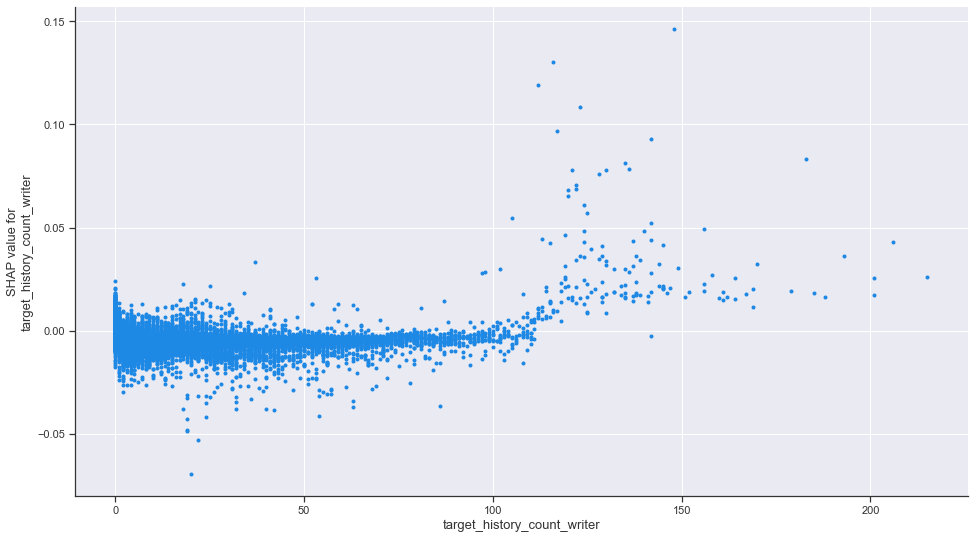

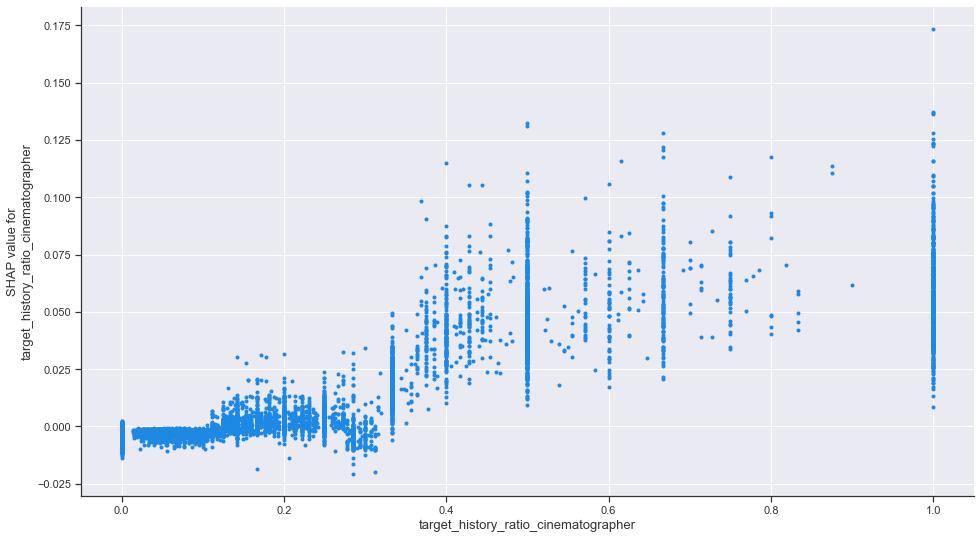

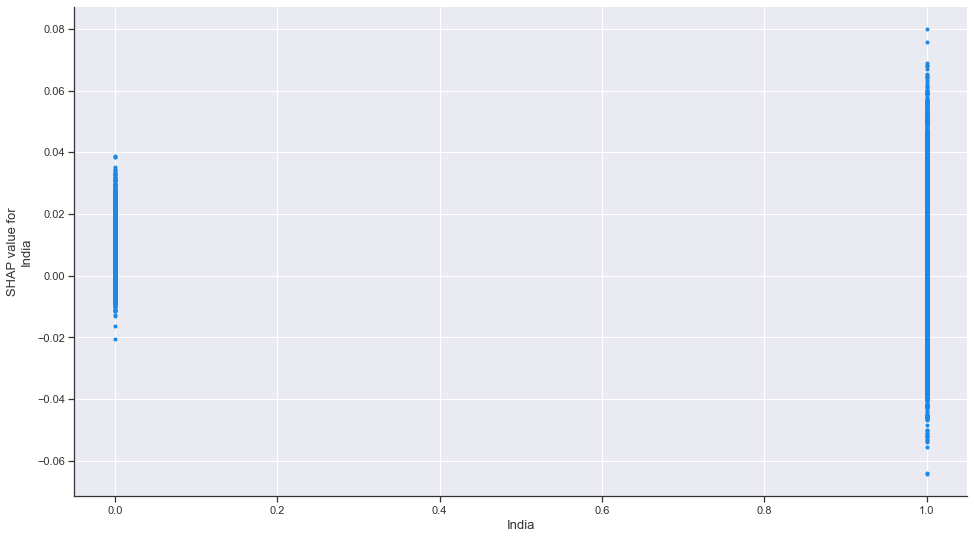

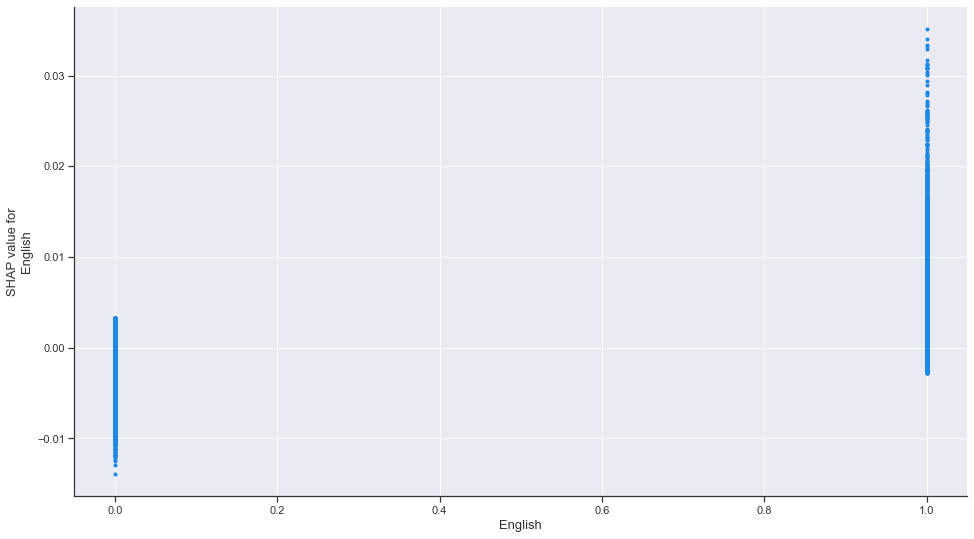

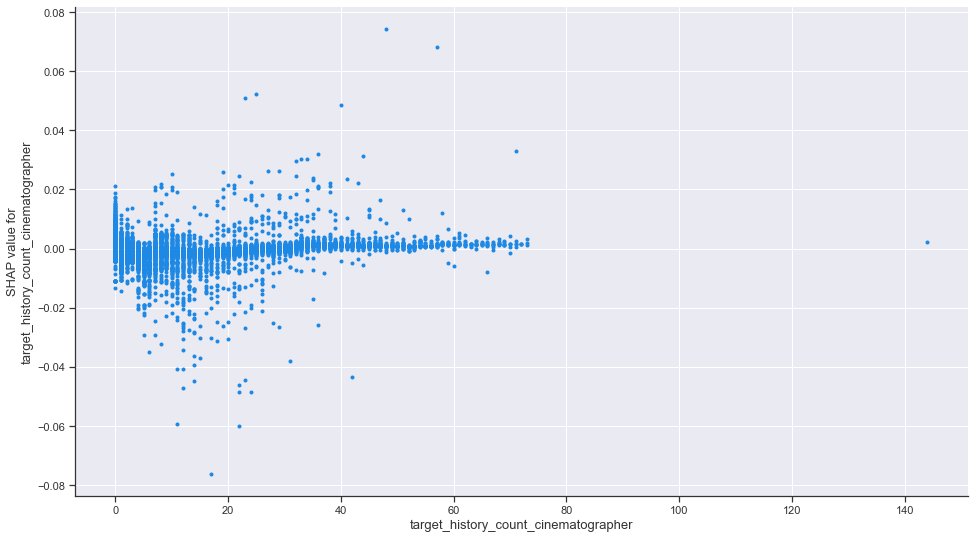

In [63]:
# same as above but without the coloring for easier reading

for feature in feature_importance_order:
    shap.dependence_plot(feature, shap_values, X_train_test[feature_list], interaction_index=None, show=False)
    f = plt.gcf()
    f.set_size_inches(16, 9)
    f.show()